![](https://mma.prnewswire.com/media/1429854/MoneyLion_Logo.jpg?p=facebook)

- <a href='#1'>1. Introduction</a>  
- <a href='#2'>2. Retrieving the Data</a>
- <a href='#3'>3. Glimpse of Data</a>
    - <a href='#3-1'>3.1 loan data</a>
    - <a href='#3-2'>3.2 Payment data</a>
    - <a href='#3-3'>3.3 clarity_underwriting data</a>
- <a href='#4'> 4. Check for missing data</a>
- <a href='#5'>5. Data Exploration</a>
    - <a href='#5-1'>5.1 Distribution of loanAmount</a>
    - <a href='#5-2'>5.2 Distribution of Scheduled Payment Amount</a>
    - <a href='#5-3'>5.3 Distribution of payment Amount</a>
    - <a href='#5-4'>5.4 Check Loan Status within Funded_loan</a>
    - <a href='#5-5'>5.5 Data is balanced or imbalanced</a>
    - <a href='#5-6'>5.6 Result of the first payment of the loan</a>
    - <a href='#5-7'>5.7 Repayment frequency of the loan:</a>
    - <a href='#5-8'>5.8 How many loan applications for each state?</a>
    - <a href='#5-9'>5.9 Average loan amount per State</a>
    - <a href='#5-10'>5.10 why some states exceed others?</a>
    - <a href='#5-11'>5.11What is the highest and lowest loan amount over time?</a>     
    - <a href='#5-12'>5.12 Exploration in terms of loan is repayed or not</a>
        - <a href='#5-12-1'>5.12.1 How many MoneyLion loans clients have paid off in the past is repayed or not in %</a>
        - <a href='#5-12-2'>5.12.2 Loan Status of Applicant's in terms of loan is repayed or not in %</a>
        - <a href='#5-12-3'>5.12.3 Result of the first payment of the loan in terms of loan is repayed or not in %</a>
        - <a href='#5-12-4'>5.12.4 Compare the loan amount for each target</a>
        - <a href='#5-12-5'>5.12.5 What is the relationship and patterns between loanAmount and loanSched. for each Traget?</a>
        - <a href='#5-12-6'>5.12.6 Does The leadType affect the loanStatus? </a>
        - <a href='#5-12-7'>5.12.7 Does The previously paid MoneyLion loans affect the loan Amount and loan Status? </a> 
        
    - <a href='#5-13'>5.13 Exploartion of Payment data</a>
        - <a href='#5-13-1'>5.13.1 Count of payment Status in %</a>
- <a href='#6'>6. Feature Engineering</a>
    - <a href='#6-1'>7.1 Aggregating Numeric Columns </a>
    - <a href='#6-2'>7.2 Aggregating Categorical Columns </a>
    - <a href='#6-3'>7.3 Extract Date Feature </a>
    - <a href='#6-4'>7.4 Pearson Correlation of features </a>
    - <a href='#6-5'>7.5 Feature Importance using Random forest </a>
    - <a href='#6-6'>7.6 Feature Importance using Lightgbm </a>

- <a href='#7'>7. Data Preprocessing </a>
    - <a href='#7-1'>7.1 Encoding Categorical Variables</a>
    - <a href='#7-2'>7.2 imputing missing data</a>

- <a href='#8'>8. Modeling</a>

# <a id='1'>1. Introduction</a>

At MoneyLion work to assess the risk of applicants more accurately. Being successful
in this objective enable to better price customers and mitigate losses on portfolio of loans. The following
challenge asks to work with a data set of loan repayment.

I will try to answer the questions about the data, do some preliminary exploration, perform the
necessary manipulations or aggregations, generate visualizations, and reach conclusions or insights.
Then built a model for predicting the loan risk or quality (loan repayment) on a given
applicant. But before diving into this task, start with more simple analyses as it may inform our model
building process.

 # <a id='2'>2. Retrieving the Data</a>

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib
import matplotlib.pyplot as plt 
import seaborn as sns 
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.offline as offline
offline.init_notebook_mode()
from sklearn.preprocessing import LabelEncoder
%matplotlib inline
# Supress unnecessary warnings so that presentation looks clean
import warnings
warnings.filterwarnings("ignore")

#Modleing Libreires
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
import itertools
import pprint

In [2]:
loan = pd.read_csv('loan.csv', parse_dates=['applicationDate','originatedDate'])
payment = pd.read_csv('payment.csv', parse_dates=['paymentDate'])
clarity_underwriting = pd.read_csv('clarity_underwriting_variables.csv')

In [3]:
print('Size of loan data', loan.shape)
print('Size of payment data', payment.shape)
print('Size of clarity underwriting data', clarity_underwriting.shape)

Size of loan data (577682, 19)
Size of payment data (689364, 9)
Size of clarity underwriting data (49752, 54)


# <a id='3'>3. Glimpse of Data</a>

## <a id='3-1'>3.1 loan data</a>

In [4]:
loan.head()

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,loanStatus,loanAmount,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF
0,LL-I-07399092,beff4989be82aab4a5b47679216942fd,B,360.0,2016-02-23 17:29:01.940,False,NaT,0.0,False,0,Withdrawn Application,500.0,978.27,IL,bvMandatory,6,NaN,5669ef78e4b0c9d3936440e6,1
1,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,Paid Off Loan,3000.0,6395.19,CA,prescreen,0,Checked,569eb3a3e4b096699f685d64,1
2,LL-I-10707532,3c174ae9e2505a5f9ddbff9843281845,B,590.0,2016-08-01 13:51:14.709,False,NaT,0.0,False,0,Withdrawn Application,400.0,1199.45,MO,bvMandatory,3,NaN,579eab11e4b0d0502870ef2f,1
3,LL-I-02272596,9be6f443bb97db7e95fa0c281d34da91,B,360.0,2015-08-06 23:58:08.880,False,NaT,0.0,False,0,Withdrawn Application,500.0,1074.05,IL,bvMandatory,3,NaN,555b1e95e4b0f6f11b267c18,1
4,LL-I-09542882,63b5494f60b5c19c827c7b068443752c,B,590.0,2016-06-05 22:31:34.304,False,NaT,0.0,False,0,Rejected,350.0,814.37,NV,bvMandatory,3,NaN,5754a91be4b0c6a2bf424772,1


In [5]:
loan['loanStatus'].value_counts()

Withdrawn Application          450984
Rejected                        85070
Paid Off Loan                   11427
External Collection             11334
New Loan                         8112
Internal Collection              5567
Returned Item                    1182
CSR Voided New Loan              1026
Settlement Paid Off               708
Credit Return Void                704
Customer Voided New Loan          504
Settled Bankruptcy                326
Pending Paid Off                  169
Charged Off Paid Off              160
Pending Application Fee             5
Pending Rescind                     4
Pending Application                 4
Voided New Loan                     2
Customver Voided New Loan           1
Settlement Pending Paid Off         1
Charged Off                         1
Name: loanStatus, dtype: int64

**Check Duplicated Values**

In [6]:
print(loan.duplicated().sum())

0


In [7]:
loan.columns.values

array(['loanId', 'anon_ssn', 'payFrequency', 'apr', 'applicationDate',
       'originated', 'originatedDate', 'nPaidOff', 'approved', 'isFunded',
       'loanStatus', 'loanAmount', 'originallyScheduledPaymentAmount',
       'state', 'leadType', 'leadCost', 'fpStatus', 'clarityFraudId',
       'hasCF'], dtype=object)

In [8]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 577682 entries, 0 to 577681
Data columns (total 19 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   loanId                            577426 non-null  object        
 1   anon_ssn                          577682 non-null  object        
 2   payFrequency                      576409 non-null  object        
 3   apr                               573760 non-null  float64       
 4   applicationDate                   577682 non-null  datetime64[ns]
 5   originated                        577682 non-null  bool          
 6   originatedDate                    46044 non-null   datetime64[ns]
 7   nPaidOff                          577658 non-null  float64       
 8   approved                          577682 non-null  bool          
 9   isFunded                          577682 non-null  int64         
 10  loanStatus                      

In [9]:
loan.describe()  

,apr,nPaidOff,isFunded,loanAmount,originallyScheduledPaymentAmount,leadCost,hasCF
count,573760.000000,577658.000000,577682.000000,575432.000000,577682.000000,577682.000000,577682.000000
mean,553.080972,0.037887,0.067480,514.245084,1428.897209,7.854389,0.619187
std,110.046159,0.333366,0.250852,320.939929,925.009141,12.853451,0.485587
min,0.000000,0.000000,0.000000,0.000000,-816.710000,0.000000,0.000000
25%,490.000000,0.000000,0.000000,350.000000,1023.640000,3.000000,0.000000
50%,590.000000,0.000000,0.000000,500.000000,1245.250000,3.000000,1.000000
75%,601.000000,0.000000,0.000000,500.000000,1615.660000,6.000000,1.000000
max,705.590000,21.000000,1.000000,5000.000000,19963.630000,200.000000,1.000000


* The count, **mean**, **min**, and **max** rows are self-explanatory.  The std row shows the standard deviation, which measures how dispersed the values are. The 25%, 50%, and 75% rows show the corresponding percentiles: a percentile indicates the value below which a given percentage of observations in a group of observations falls. For example, 25% of the **loanAmount** lower than 350, while 50% are lower than 500 and 75% are lower than 500. These are often called the 25th percentile (or 1st quartile), the median, and the 75th percentile (or 3rd quartile).

*  It seems that there are anomalous values in the values of **loanAmout** and **originallyScheduledPaymentAmount**, i will figure out it later
*  There is a negative sign in the **originallyScheduledPaymentAmount**, i will also find out if this is a pattern or an anomaly

In [10]:
loan['state'].value_counts(normalize=False)

OH         90496
IL         66710
TX         49729
MO         49249
WI         40349
MI         34635
TN         32991
NC         26962
FL         25896
IN         25781
SC         23925
CA         22691
NV         11477
PA          9723
VA          9197
NJ          7641
UT          6742
AL          4327
MS          3786
CO          3615
LA          3431
AZ          3355
NM          3231
KY          2911
SD          2212
MN          2078
GA          1763
OK          1758
WY          1715
CT          1468
WA          1384
KS          1227
IA          1043
DE           880
ID           722
RI           689
NE           635
HI           621
AK           290
ND           207
NY             3
MD             3
TX-TEST        1
OH-TEST        1
Name: state, dtype: int64

later:drop raws which states are TX-TEST,OH-TEST


In [11]:
loan1=loan.copy() #make a copy for aggregation  

**What does the negative sign in the `originallyScheduledPaymentAmount` indicate?**

In [12]:
Scheduled_neg = loan1.groupby(["loanStatus","state"]).agg({'originallyScheduledPaymentAmount': ['min', 'count']},)
Scheduled_neg.sort_values([('originallyScheduledPaymentAmount','min'),"state"], ascending=[True,True], inplace=True)
Scheduled_neg.head(3)

originallyScheduledPaymentAmount       
                                                         min  count
loanStatus            state                                        
Withdrawn Application SC                             -816.71  18880
                      AK                                0.00    217
Rejected              AL                                0.00    578

 *  the negative sign is due to incorrectly entered , so should drop it 

Let us shed light on a one loan Status :**bankruptcy settlement** ,which mean the borrower will not able to repayment the loan

**Q : Is there a relationship between the loan amount and the borrower being in a bankruptcy settlement Status?**

In [121]:
Settled_Bankruptcy = loan1[loan1['loanStatus']=='Settled Bankruptcy']
Settled_Bankruptcy_agg = Settled_Bankruptcy.groupby(["loanStatus", "state"]).agg({'loanAmount': ['mean', 'count']},)
Settled_Bankruptcy_agg.sort_values([('loanAmount','count'),"state"], ascending=[False,True], inplace=True)
Settled_Bankruptcy_agg.head(15)

loanAmount      
                                 mean count
loanStatus         state                   
Settled Bankruptcy IL      643.747475    99
                   OH      570.118644    59
                   WI      565.333333    33
                   MO      454.166667    24
                   IN      632.500000    20
                   TN      554.350000    20
                   CA     1946.875000    16
                   MI      653.125000    16
                   TX      462.500000     8
                   NC      733.333333     6
                   UT      415.000000     5
                   NJ      700.000000     4
                   VA     1000.000000     4
                   NV      700.000000     3
                   AZ      500.000000     2

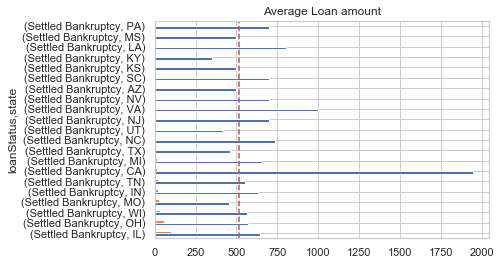

In [130]:
Settled_Bankruptcy_agg.plot(kind = "barh", y = "loanAmount", legend = False,
            title = "Average Loan amount")
plt.axvline(loan['loanAmount'].mean() ,color='r', linestyle='--', gid='mean')

* Most of the borrowers who declared bankruptcy demanded a loan amount above the general average from all borrowers.

**Q : Is there a relationship between the `ScheduledPaymentAmount` and the borrower being in a bankruptcy settlement Status?**

In [124]:
Scheduled = loan1[loan1['loanStatus']=='Settled Bankruptcy']
Scheduled = Scheduled.groupby(["loanStatus","state"]).agg({'originallyScheduledPaymentAmount': ['mean', 'count']})
Scheduled.sort_values([('originallyScheduledPaymentAmount','count'),"state"], ascending=[False,True], inplace=True)
Scheduled.head(20)

originallyScheduledPaymentAmount      
                                                     mean count
loanStatus         state                                       
Settled Bankruptcy IL                         1355.067475    99
                   OH                         1667.822881    59
                   WI                         1215.263636    33
                   MO                         1248.799167    24
                   IN                         1864.839000    20
                   TN                         1682.922500    20
                   CA                         5108.276250    16
                   MI                         1875.310625    16
                   TX                         1133.386250     8
                   NC                         2171.988333     6
                   UT                         1310.708000     5
                   NJ                         2247.737500     4
                   VA                         2066.125000     4
                   NV                         2067.440000     3
                   AZ                         1617.360000     2
                   SC                         1882.550000     2
                   KS                         1498.770000     1
                   KY                         1034.750000     1
                   LA                         2579.200000     1
                   MS                         1746.950000     1

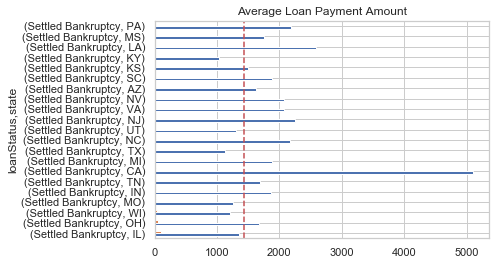

In [131]:
Scheduled.plot(kind = "barh", y = "originallyScheduledPaymentAmount", legend = False,
            title = "Average Loan Payment Amount")
plt.axvline(loan['originallyScheduledPaymentAmount'].mean() ,color='r', linestyle='--')

* Most of the borrowers who Settled Bankruptcy have a originally scheduled	repayment amount above the general average from all borrowers.

**Q : Is there a relationship between the `MoneyLion loans paid off` and the borrower being in a bankruptcy settlement Status?**

In [15]:
Scheduled=loan1[loan1['loanStatus']=='Settled Bankruptcy']
nPaidOff_agg=Scheduled.groupby(["loanStatus","state"]).agg({'nPaidOff': ['mean', 'count']})
nPaidOff_agg.sort_values([('nPaidOff','count')], ascending=[False], inplace=True)
nPaidOff_agg.head(50)

nPaidOff      
                              mean count
loanStatus         state                
Settled Bankruptcy IL     0.333333    99
                   OH     0.305085    59
                   WI     0.727273    33
                   MO     0.083333    24
                   IN     0.350000    20
                   TN     0.200000    20
                   CA     0.062500    16
                   MI     0.312500    16
                   TX     0.375000     8
                   NC     1.000000     6
                   UT     0.000000     5
                   NJ     0.000000     4
                   VA     0.000000     4
                   NV     0.666667     3
                   SC     0.000000     2
                   AZ     1.000000     2
                   MS     0.000000     1
                   LA     0.000000     1
                   PA     0.000000     1
                   KY     0.000000     1
                   KS     0.000000     1

## <span style='background :yellow' > Target column Pre- processing </span>

The target column in our dataset is **loan status** which has different unique values.These values will have to be transformed to binary. That is 0 for a good borrower and 1 for a bad borrower. <br>
The definition of a bad borrower in our case is one who falls under the following in our target column`[Charged Off,Settled Bankruptcy]`.<br>The rest are classified as good borrowers.

In [16]:
loan['loanStatus'].value_counts(normalize=True)

Withdrawn Application          0.781207
Rejected                       0.147361
Paid Off Loan                  0.019794
External Collection            0.019633
New Loan                       0.014052
Internal Collection            0.009643
Returned Item                  0.002047
CSR Voided New Loan            0.001777
Settlement Paid Off            0.001226
Credit Return Void             0.001219
Customer Voided New Loan       0.000873
Settled Bankruptcy             0.000565
Pending Paid Off               0.000293
Charged Off Paid Off           0.000277
Pending Application Fee        0.000009
Pending Rescind                0.000007
Pending Application            0.000007
Voided New Loan                0.000003
Customver Voided New Loan      0.000002
Settlement Pending Paid Off    0.000002
Charged Off                    0.000002
Name: loanStatus, dtype: float64

#### Q:What are the loan statues that are not funded?

In [17]:
Not_Funded_loan = loan[loan['isFunded']==0]
Not_Funded_loan['loanStatus'].value_counts(normalize=True)

Withdrawn Application        0.837779
Rejected                     0.158032
CSR Voided New Loan          0.001906
Credit Return Void           0.001308
Customer Voided New Loan     0.000936
Pending Application Fee      0.000009
Pending Rescind              0.000007
Pending Application          0.000007
Internal Collection          0.000006
Voided New Loan              0.000004
Charged Off Paid Off         0.000002
Customver Voided New Loan    0.000002
Settled Bankruptcy           0.000002
Name: loanStatus, dtype: float64

**Q:What are the loan statues that are funded?**

In [18]:
Funded_loan = loan[loan['isFunded']==1]
Funded_loan['loanStatus'].value_counts(normalize=True)

Paid Off Loan                  0.293135
External Collection            0.290750
New Loan                       0.208096
Internal Collection            0.142733
Returned Item                  0.030322
Settlement Paid Off            0.018162
Settled Bankruptcy             0.008337
Pending Paid Off               0.004335
Charged Off Paid Off           0.004079
Charged Off                    0.000026
Settlement Pending Paid Off    0.000026
Name: loanStatus, dtype: float64

In [19]:
Funded_loan.shape

(38982, 19)

**Q:What are the mutual loans statues that have been either funded or not?**

In [20]:
Not_funded_Status=Not_Funded_loan['loanStatus'].unique()
loan2 = loan[(loan['loanStatus'].isin(Not_funded_Status))& (loan['isFunded']==1)]
loan2['loanStatus'].unique()

array(['Internal Collection', 'Charged Off Paid Off',
       'Settled Bankruptcy'], dtype=object)


## <span style='background :yellow' > Create a target variable </span>
create a new column based on the loan_status column that will be our target variable, and consider only funded loans<br>
I will Drop the original 'loanStatus' column later

In [21]:
Funded_loan['Target'] = np.where(Funded_loan.loc[:, 'loanStatus'].isin(['Charged Off','Settled Bankruptcy']), 1, 0)

## <a id='3-2'>3.2 payment data</a>

In [22]:
payment.head()    

,loanId,installmentIndex,isCollection,paymentDate,principal,fees,paymentAmount,paymentStatus,paymentReturnCode
0,LL-I-00000021,1,False,2014-12-19 05:00:00,22.33,147.28,169.61,Checked,NaN
1,LL-I-00000021,2,False,2015-01-02 05:00:00,26.44,143.17,169.61,Checked,NaN
2,LL-I-00000021,3,False,2015-01-16 05:00:00,31.30,138.31,169.61,Checked,NaN
3,LL-I-00000021,4,False,2015-01-30 05:00:00,37.07,132.54,169.61,Checked,NaN
4,LL-I-00000021,5,False,2015-02-13 05:00:00,43.89,125.72,169.61,Checked,NaN


In [23]:
payment['paymentStatus'].value_counts(normalize=True)

Cancelled                  0.392150
Checked                    0.304079
None                       0.237983
Rejected                   0.046898
Pending                    0.013405
Skipped                    0.005456
Rejected Awaiting Retry    0.000026
Complete                   0.000001
Returned                   0.000001
Name: paymentStatus, dtype: float64

## <a id='3-3'>3.3 clarity underwriting data</a>

In [24]:
clarity_underwriting.head()

,.underwritingdataclarity.clearfraud.clearfraudinquiry.thirtydaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.twentyfourhoursago,.underwritingdataclarity.clearfraud.clearfraudinquiry.oneminuteago,.underwritingdataclarity.clearfraud.clearfraudinquiry.onehourago,.underwritingdataclarity.clearfraud.clearfraudinquiry.ninetydaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.sevendaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.tenminutesago,.underwritingdataclarity.clearfraud.clearfraudinquiry.fifteendaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.threesixtyfivedaysago,.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryonfilecurrentaddressconflict,...,.underwritingdataclarity.clearfraud.clearfraudidentityverification.phonematchtypedescription,.underwritingdataclarity.clearfraud.clearfraudidentityverification.overallmatchresult,.underwritingdataclarity.clearfraud.clearfraudidentityverification.phonetype,.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssndobreasoncode,.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssnnamereasoncode,.underwritingdataclarity.clearfraud.clearfraudidentityverification.nameaddressreasoncode,.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssndobmatch,.underwritingdataclarity.clearfraud.clearfraudidentityverification.overallmatchreasoncode,clearfraudscore,underwritingid
0,8.0,2.0,2.0,2.0,8.0,2.0,2.0,5.0,10.0,False,...,(M) Mobile Phone,partial,NaN,NaN,NaN,A8,match,6.0,871.0,54cbffcee4b0ba763e43144d
1,5.0,2.0,2.0,2.0,11.0,2.0,2.0,4.0,21.0,True,...,(M) Mobile Phone,partial,NaN,NaN,NaN,NaN,match,11.0,397.0,54cc0408e4b0418d9a7f78af
2,9.0,4.0,2.0,3.0,10.0,8.0,2.0,9.0,25.0,False,...,(M) Mobile Phone,match,NaN,NaN,NaN,NaN,match,1.0,572.0,54cc0683e4b0418d9a80adb6
3,3.0,2.0,2.0,2.0,9.0,2.0,2.0,2.0,9.0,False,...,(M) Mobile Phone,partial,NaN,NaN,NaN,NaN,match,11.0,838.0,54cc0780e4b0ba763e43b74a
4,5.0,5.0,2.0,2.0,6.0,5.0,2.0,5.0,6.0,False,...,(M) Mobile Phone,match,NaN,NaN,NaN,NaN,match,1.0,768.0,54cc1d67e4b0ba763e445b45


In [25]:
clarity_underwriting.shape

(49752, 54)


### <span style='color :blue' >Loan-clarity_underwriting merge </span>

Let’s start with a classification model with use only `clearfraudscore` then gradually add one feature at a time, according to which feature improves the model the most.

In [26]:
Loan_underwriting_merge = pd.merge(Funded_loan, clarity_underwriting[['underwritingid','clearfraudscore']],
                                     left_on='clarityFraudId', 
                                     right_on='underwritingid',
                                     how="left")
Loan_underwriting_merge.head()

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,...,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF,Target,underwritingid,clearfraudscore
0,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,...,6395.19,CA,prescreen,0,Checked,569eb3a3e4b096699f685d64,1,0,569eb3a3e4b096699f685d64,879.0
1,LL-I-12263369,accf40708233e8b7d05fcb89d5a9c081,B,475.0,2016-11-28 19:54:22.982,True,2016-11-29 20:30:40.640,2.0,True,1,...,893.88,MO,organic,0,Checked,NaN,0,0,NaN,NaN
2,LL-I-17826953,7529d29c9d943cc55bc71a85d9c6b7a3,W,645.0,2017-03-01 15:55:41.823,True,2017-03-01 16:15:13.016,0.0,True,1,...,1364.87,NJ,lead,40,Checked,58b6eef8e4b0b6fca82fd426,1,0,58b6eef8e4b0b6fca82fd426,658.0
3,LL-I-16519347,bc9fa73468acf18cb968a3a6a3c4697c,S,490.0,2017-01-31 17:48:17.381,True,2017-01-31 18:00:14.520,2.0,True,1,...,3313.78,MO,organic,0,Checked,58450a15e4b0bb9d6d7344c7,1,0,58450a15e4b0bb9d6d7344c7,835.0
4,LL-I-11506719,10cefd11d41612b032fd9cd2debe32dc,B,590.0,2016-08-27 09:08:05.442,True,2016-08-29 15:05:04.014,0.0,True,1,...,2432.08,CA,bvMandatory,10,Checked,578f9346e4b0810ad5e7b72e,1,0,578f9346e4b0810ad5e7b72e,624.0


In [27]:
Loan_underwriting_merge.shape

(38982, 22)

# <a id='4'> 4 Check for missing data</a>

In [28]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

**checking missing data in loan**

In [29]:
missing_data(Funded_loan)

,Total,Percent
clarityFraudId,6622,16.987327
nPaidOff,21,0.053871
fpStatus,9,0.023088
Target,0,0.000000
approved,0,0.000000
anon_ssn,0,0.000000
payFrequency,0,0.000000
apr,0,0.000000
applicationDate,0,0.000000
originated,0,0.000000


**checking missing data in payment**

In [30]:
missing_data(payment).head(3)

,Total,Percent
paymentReturnCode,657831,95.425784
paymentStatus,0,0.000000
paymentAmount,0,0.000000


**checking missing data in clarity_underwriting**

In [31]:
missing_data(clarity_underwriting).head(15)

,Total,Percent
.underwritingdataclarity.clearfraud.clearfraudidentityverification.phonetype,48237,96.954896
.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssnnamereasoncode,47083,94.635392
.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssnnamereasoncodedescription,47083,94.635392
.underwritingdataclarity.clearfraud.clearfraudidentityverification.nameaddressreasoncodedescription,44125,88.689902
.underwritingdataclarity.clearfraud.clearfraudidentityverification.nameaddressreasoncode,44125,88.689902
.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssndobreasoncode,40723,81.851986
.underwritingdataclarity.clearfraud.clearfraudindicator.driverlicenseinconsistentwithonfile,39697,79.789757
.underwritingdataclarity.clearfraud.clearfraudindicator.workphonepreviouslylistedascellphone,28336,56.954494
.underwritingdataclarity.clearfraud.clearfraudindicator.workphonepreviouslylistedashomephone,28336,56.954494
.underwritingdataclarity.clearfraud.clearfraudindicator.driverlicenseformatinvalid,5049,10.148336


# <a id='5'>5. Data Exploration</a>

## <a id='5-1'>5.1 Distribution of loanAmount</a>

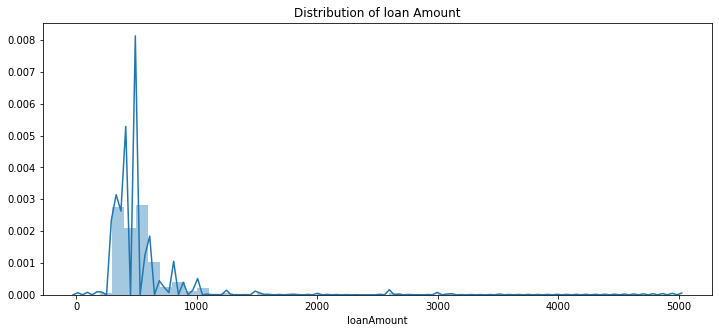

In [32]:
plt.figure(figsize=(12,5))
plt.title("Distribution of loan Amount")
ax = sns.distplot(loan["loanAmount"]) 

## <a id='5-2'>5.2 Distribution of Scheduled Payment AmountL</a>

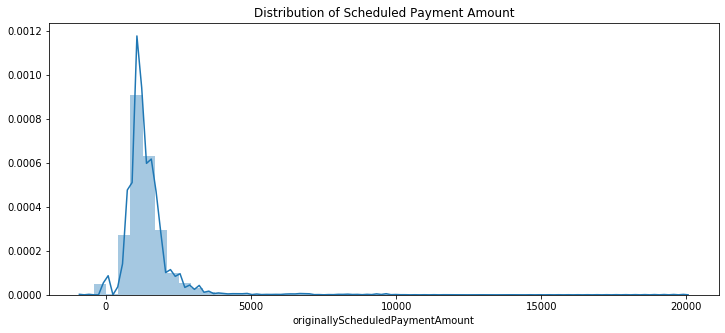

In [33]:
plt.figure(figsize=(12,5))
plt.title("Distribution of Scheduled Payment Amount")
ax = sns.distplot(loan["originallyScheduledPaymentAmount"]) 

## <a id='5-3'>5.3 Distribution of payment Amount</a>

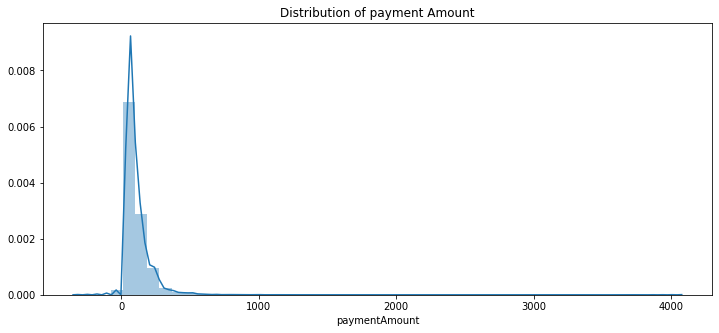

In [34]:
plt.figure(figsize=(12,5))
plt.title("Distribution of payment Amount")
ax = sns.distplot(payment["paymentAmount"].dropna())

## <a id='5-4'>5.4 Check Loan Status within Funded_loan</a>

In [35]:
temp = Funded_loan['loanStatus'].value_counts()

trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
)
data = [trace]
layout = go.Layout(
    title = "Check Loan Status within Funded_loan in % ",
    xaxis=dict(
        title='Name of Loan Status',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Loans for each Loan Status in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='Check Loan Status')

## <a id='5-5'>5.5 Data is balanced or imbalanced</a>

In [36]:
temp = Funded_loan['Target'].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
fig = px.pie(df, values='values', names='labels', title='Loan Repayed or not')
py.iplot(fig, filename='Loan Repayed or not')

* As we can see data is highly imbalanced.

## <a id='5-6'>5.6 Result of the first payment of the loan</a>

In [37]:
temp = loan["fpStatus"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .48]},
      #"name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .7,
      "type": "pie"
    },
    
    ],
  "layout": {
        "title":"Result of the first payment",
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Loan Types",
                "x": 0.17,
                "y": 0.5
            }
            
        ]
    }
}
iplot(fig, filename='donut')

* Most of the loans first result are Checked – payment is successful. **63.8 %** 

## <a id='5-7'>5.7 Repayment frequency of the loan:</a>

In [38]:
temp = loan["payFrequency"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
fig = px.pie(df, values='values', names='labels', title='Repayment frequency')
py.iplot(fig, filename='Repayment frequency')

* 54.9 % Applicants biweekly repayment frequency .  23.8 % are weekly repayment frequency. 

## <a id='5-8'>5.8 How many loan applications for each state? </a>

In [39]:
df_state = pd.DataFrame(loan['state'].value_counts()).reset_index()
df_state.rename(columns = {'index':'state', 'state':'count'}, inplace=True)

fig = go.Figure(data=go.Choropleth(
    locations=df_state['state'], # Spatial coordinates
    z = df_state['count'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Number of Loans",
))

fig.update_layout(
    title_text = 'Loans by State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

* **Top Applicant's who applied for loan :**
  * Ohio - Apprx. 90 K
  * Illinois - Approx. 66 K
  * Missouri, Texas - Approx. 49 K
  * Wisconsin - Approx. 40 K

## <a id='5-9'>5.9 Average loan amount per State</a>

Text(0.5, 0, 'states')

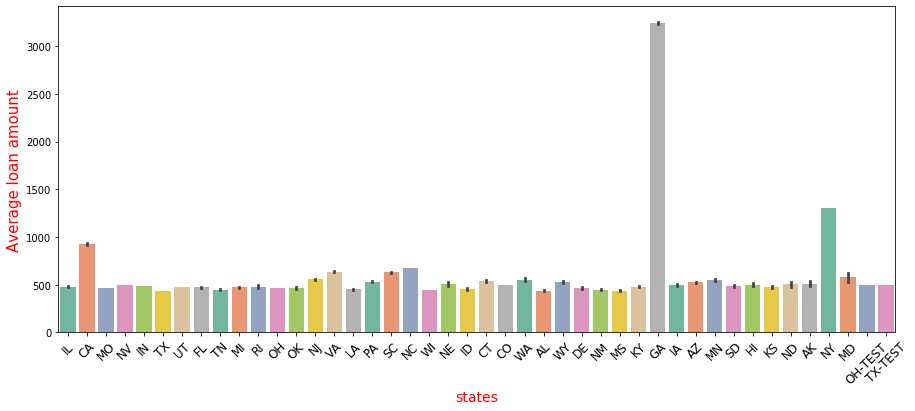

In [40]:
f, ax = plt.subplots(figsize=(15, 6))
sns.barplot(x='state', y='loanAmount', data=loan,
              palette="Set2")
           
plt.xticks(rotation= 45,fontsize=12 )
ax.set_ylabel('Average loan amount', fontsize=15, color='r')
ax.set_xlabel('states', fontsize=14, color='r')

* The highest average loans are from Georgia, followed by New York

## <a id='5-10'>5.10 why some states exceed others?</a>

Text(0.5, 0, 'states')

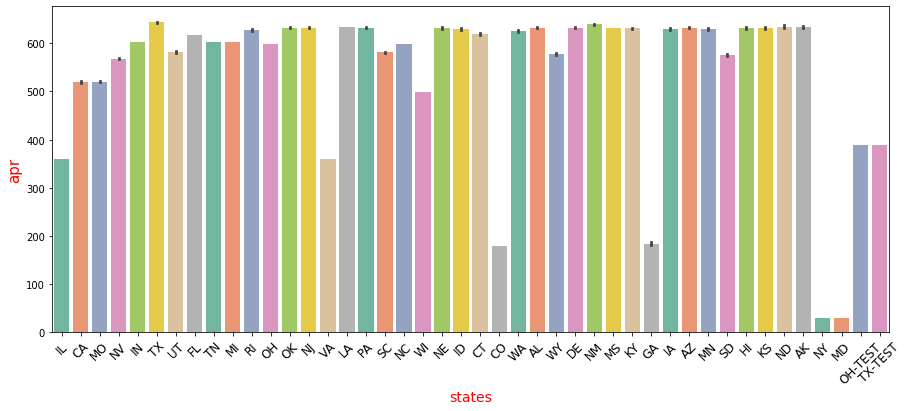

In [41]:
f, ax = plt.subplots(figsize=(15, 6))
sns.barplot(x='state', y='apr', data=loan,
              palette="Set2")
           
plt.xticks(rotation= 45,fontsize=12 )
ax.set_ylabel('apr', fontsize=15, color='r')
ax.set_xlabel('states', fontsize=14, color='r')

* The most reasonable explaination for high loan amount is low annual percentage rate. Georgia's customers having an average of approximately 180 apr, which is somewhat low. New York's customers is lowest among all of the state.

## <a id='5-11'>5.11 What is the highest and lowest loan amount over time?</a>

In [42]:
loan_dates=Funded_loan.sort_values(by='applicationDate')
fig = px.line(loan_dates, x='applicationDate', y='loanAmount', title=' loan amount over time')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

**Logarithmic trendlines**  

A logarithmic trendline is a best-fit curved line that is used when the rate of change in the data
increases or decreases quickly and then levels out.

# <a id='5-12'>5.12 Exploration in terms of loan is repayed or not</a>

## <a id='5-12-1'>5.12.1 How many MoneyLion loans clients have paid off in the past is repayed or not in %</a>

In [43]:
temp = Funded_loan["nPaidOff"].value_counts()
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(Funded_loan["Target"][Funded_loan["nPaidOff"]==val] == 0))
    temp_y0.append(np.sum(Funded_loan["Target"][Funded_loan["nPaidOff"]==val] == 1))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "MoneyLion loans clients have paid off in the past is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Past MoneyLion loans',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

*  All the data we have on clients who have defaulted  are from those who have never paid a previous loan to MoneyLion.

## <a id='5-12-2'>5.12.2 Loan Status of Applicant's in terms of loan is repayed or not in %</a>

In [44]:
temp = Funded_loan["loanStatus"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(Funded_loan["Target"][Funded_loan["loanStatus"]==val] == 0))
    temp_y0.append(np.sum(Funded_loan["Target"][Funded_loan["loanStatus"]==val] == 1))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Loan Status of Applicant's in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Loan Status',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

## <a id='5-12-3'>5.12.3 Result of the first payment of the loan in terms of loan is repayed or not in %</a>

In [45]:
temp = Funded_loan["fpStatus"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(Funded_loan["Target"][Funded_loan["fpStatus"]==val] == 0))
    temp_y0.append(np.sum(Funded_loan["Target"][Funded_loan["fpStatus"]==val] == 1))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / temp.sum()) * 100,
    name='YES'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / temp.sum()) * 100, 
    name='NO'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Result of the first payment of the loan in terms of loan is repayed or not in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='first payment',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

*  All the data we have on clients who have defaulted  are from those who have first payment is successful.
*  This means that it is not a condition when the customer pays the first payment successfully that he will complete the rest of the loan payment

## <a id='5-12-4'>5.12.4 Compare the loan amount for each target</a>

In [46]:
df = px.data.tips()
fig = px.box(Funded_loan, x="Target", y="loanAmount")
fig.show()

*  defaulted-loans have higher minimum value for loan amount, starting around 200 as compared to non-defaulted loans where lower bound of loan amount is 100.
*  The median is same.


## <a id='5-12-5'>5.12.5 What is the relationship and patterns between loanAmount and loanSched. for each Traget?</a>

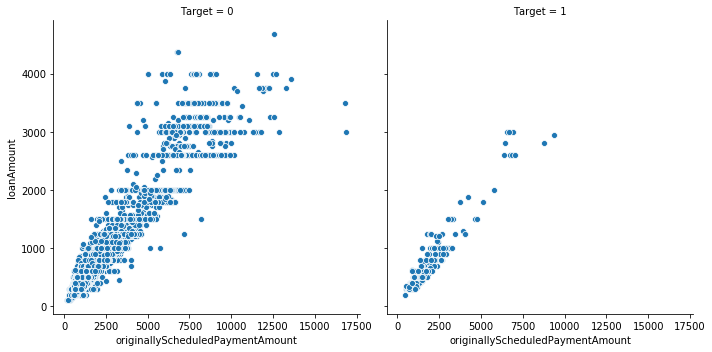

In [47]:
sns.relplot(x="originallyScheduledPaymentAmount",
y="loanAmount",
data=Funded_loan,
kind="scatter",
col="Target",
col_wrap=2)
plt.show()

*  strong ,positive, linear relationship.
*  We can also observe an outlier point.

## <a id='5-12-6'>5.12.6 Does The leadType affect the loanStatus? </a>

In [48]:
data_make_model = Funded_loan.groupby(['loanStatus', 'leadType']).size().reset_index()
data_make_model.rename(columns = {0:'lead_count'}, inplace=True)
data_make_model['loan_count'] = data_make_model['loanStatus'].apply(
    lambda x : data_make_model[data_make_model['loanStatus'] == x]['lead_count'].sum())
data_make_model.sort_values(by = 'loan_count', ascending=False, inplace=True)
fig =px.scatter(data_make_model,
             x = 'loanStatus', y='lead_count', color = 'leadType',width=800, height=500,
                title='The relation between loanStatus and leadType')
fig.show()

## <a id='5-12-7'>5.12.7 Does The previously paid MoneyLion loans affect the loan Amount and loan Status? </a>

In [49]:
fig =px.scatter(Funded_loan,
             x = 'loanStatus', y='loanAmount', color = 'nPaidOff',width=900, height=500,
                title='previously paid MoneyLion loans With Loan Statues')
fig.show()

*  Here we can figure out an insights between the MoneyLion loans has paid off ,and the loan amount.
 In additional to insights between the MoneyLion loans has paid off , and loan statues.  
 *  There is no strong correlation between them 

# <a id='5-13'>5.13 Exploartion of Payment data</a>

## <a id='5-13-1'>5.13.1 Count of payment Status in %</a>

In [50]:
temp = payment['paymentStatus'].value_counts()

trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
)
data = [trace]
layout = go.Layout(
    title = "Count of payment Status in % ",
    xaxis=dict(
        title='payment Status',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of payment Status in %',
        titlefont=dict(
            size=11,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=10,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='Check Payment Status')

* **payment Status :**
  * Cancelled - 40 %
  * Checked - 30 %
  * Rejected - 5%

# <a id='6'>6. Feature Engineering </a>

## <a id='6-1'>6.1 Aggregating Numeric Columns </a>

Since I have limited domain knowledge of loans and what makes a person likely to default, I will instead concentrate of getting as much info as possible into the final training dataframe. The idea is that the model will then pick up on which features are important rather than us having to decide that. Basically, our approach is to make as many features as possible and then give them all to the model to use! Later, we can perform feature reduction using the feature importances from the model or other techniques such as PCA.

Each row in **payment** file represents an ACH attempt associated to the loan.<br>


Aggregating Numeric Columns  

To account for the numeric information in the Payment dataframe, we can compute statistics for all the numeric columns. To do so, we groupby the `LoanId`, agg the grouped dataframe, and merge the result back into the training data. The agg function will only calculate the values for the numeric columns where the operation is considered valid. We will stick to using `'mean', 'max', 'min', 'sum' ` but any function can be passed in here. We can even write our own function and use it in an agg call.

In [51]:
# Group by the LoanId, calculate aggregation statistics
payment_agg = payment.drop(columns = ['paymentDate','isCollection' ,'paymentReturnCode']).groupby('loanId', as_index = False).agg(['count', 'mean', 'max', 'min', 'sum']).reset_index()
payment_agg.head()

loanId installmentIndex                         principal  \
                            count       mean max min  sum     count   
0  LL-I-00000021               13   6.076923  12   1   79        13   
1  LL-I-00000231               20  10.500000  20   1  210        20   
2  LL-I-00000238               16   8.500000  16   1  136        16   
3  LL-I-00000308               22  11.500000  22   1  253        22   
4  LL-I-00000355               23  12.000000  23   1  276        23   

                            ...  fees                                     \
        mean     max   min  ... count       mean     max    min      sum   
0  61.539231  143.15  0.01  ...    13  95.016154  147.28   0.00  1235.21   
1  75.123500  147.24  0.00  ...    20  94.827500  147.28  27.11  1896.55   
2  79.098750  147.24  0.00  ...    16  91.692500  147.28  27.11  1467.08   
3  17.805455   47.82  2.79  ...    22  43.784545   58.80  13.77   963.26   
4  43.478261   92.02  0.00  ...    23  63.109565   92.05  16.94  1451.52   

  paymentAmount                                       
          count        mean     max     min      sum  
0            13  156.555385  169.61    0.01  2035.22  
1            20  169.951000  174.48   84.16  3399.02  
2            16  170.791250  174.48  115.72  2732.66  
3            22   61.590000   61.59   61.59  1354.98  
4            23  106.587826  109.05   52.60  2451.52  

[5 rows x 21 columns]

I need to create new names for each of these columns. The following code makes new names by appending the stat to the name. Here we have to deal with the fact that the dataframe has a multi-level index. I find these confusing and hard to work with, so I try to reduce to a single level index as quickly as possible.

In [52]:
# List of column names
columns = ['loanId']

# Iterate through the variables names
for var in payment_agg.columns.levels[0]:
    # Skip the id name
    if var != 'loanId':
        
        # Iterate through the stat names
        for stat in payment_agg.columns.levels[1][:-1]:
            # Make a new column name for the variable and stat
            columns.append('payment_%s_%s' % (var, stat))
            
# Assign the list of columns names as the dataframe column names
payment_agg.columns = columns
payment_agg.head()

,loanId,payment_installmentIndex_count,payment_installmentIndex_mean,payment_installmentIndex_max,payment_installmentIndex_min,payment_installmentIndex_sum,payment_principal_count,payment_principal_mean,payment_principal_max,payment_principal_min,...,payment_fees_count,payment_fees_mean,payment_fees_max,payment_fees_min,payment_fees_sum,payment_paymentAmount_count,payment_paymentAmount_mean,payment_paymentAmount_max,payment_paymentAmount_min,payment_paymentAmount_sum
0,LL-I-00000021,13,6.076923,12,1,79,13,61.539231,143.15,0.01,...,13,95.016154,147.28,0.00,1235.21,13,156.555385,169.61,0.01,2035.22
1,LL-I-00000231,20,10.500000,20,1,210,20,75.123500,147.24,0.00,...,20,94.827500,147.28,27.11,1896.55,20,169.951000,174.48,84.16,3399.02
2,LL-I-00000238,16,8.500000,16,1,136,16,79.098750,147.24,0.00,...,16,91.692500,147.28,27.11,1467.08,16,170.791250,174.48,115.72,2732.66
3,LL-I-00000308,22,11.500000,22,1,253,22,17.805455,47.82,2.79,...,22,43.784545,58.80,13.77,963.26,22,61.590000,61.59,61.59,1354.98
4,LL-I-00000355,23,12.000000,23,1,276,23,43.478261,92.02,0.00,...,23,63.109565,92.05,16.94,1451.52,23,106.587826,109.05,52.60,2451.52


Merge with the Loan_underwriting_merge data :

In [53]:
Loan_underwriting_merge['loanId']

0        LL-I-06644937
1        LL-I-12263369
2        LL-I-17826953
3        LL-I-16519347
4        LL-I-11506719
             ...      
38977    LL-I-12367915
38978    LL-I-15280684
38979    LL-I-09897110
38980    LL-I-14178923
38981    LL-I-13311312
Name: loanId, Length: 38982, dtype: object

In [54]:
merge_data = Loan_underwriting_merge.merge(payment_agg, on = 'loanId', how = 'left')
merge_data.head()

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,...,payment_fees_count,payment_fees_mean,payment_fees_max,payment_fees_min,payment_fees_sum,payment_paymentAmount_count,payment_paymentAmount_mean,payment_paymentAmount_max,payment_paymentAmount_min,payment_paymentAmount_sum
0,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,...,25.0,135.807600,217.39,0.00,3395.19,25.0,283.458800,691.28,266.46,7086.47
1,LL-I-12263369,accf40708233e8b7d05fcb89d5a9c081,B,475.0,2016-11-28 19:54:22.982,True,2016-11-29 20:30:40.640,2.0,True,1,...,13.0,41.836923,59.54,10.58,543.88,13.0,68.760000,68.77,68.64,893.88
2,LL-I-17826953,7529d29c9d943cc55bc71a85d9c6b7a3,W,645.0,2017-03-01 15:55:41.823,True,2017-03-01 16:15:13.016,0.0,True,1,...,26.0,37.110385,56.55,5.82,964.87,26.0,52.495000,56.55,52.31,1364.87
3,LL-I-16519347,bc9fa73468acf18cb968a3a6a3c4697c,S,490.0,2017-01-31 17:48:17.381,True,2017-01-31 18:00:14.520,2.0,True,1,...,13.0,165.194615,235.79,51.33,2147.53,13.0,357.502308,1333.75,276.14,4647.53
4,LL-I-11506719,10cefd11d41612b032fd9cd2debe32dc,B,590.0,2016-08-27 09:08:05.442,True,2016-08-29 15:05:04.014,0.0,True,1,...,13.0,125.544615,170.90,34.55,1632.08,13.0,187.083077,187.24,187.07,2432.08



## <a id='6-2'>6.2 Aggregating Categorical Columns  </a>

use groupby on `'loanId'` and `'paymentStatus'` with unstack over paymentStatus, then fill NaNs with zeros.

In [55]:
payment_statues=payment.groupby(['loanId','paymentStatus']).size().unstack('paymentStatus', fill_value=0).reset_index()
payment_statues.columns.name = None
display(payment_statues.head(3))

,loanId,Cancelled,Checked,Complete,None,Pending,Rejected,Rejected Awaiting Retry,Returned,Skipped
0,LL-I-00000021,0,12,0,0,0,1,0,0,0
1,LL-I-00000231,8,2,0,8,0,2,0,0,0
2,LL-I-00000238,4,7,0,4,0,1,0,0,0


### <span style='color :blue' >Loan-Payment merge </span>

In [56]:
final_data = pd.merge(merge_data, payment_statues, how="left", on="loanId")
final_data.head(3)

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,...,payment_paymentAmount_sum,Cancelled,Checked,Complete,None,Pending,Rejected,Rejected Awaiting Retry,Returned,Skipped
0,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,...,7086.47,3.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,LL-I-12263369,accf40708233e8b7d05fcb89d5a9c081,B,475.0,2016-11-28 19:54:22.982,True,2016-11-29 20:30:40.640,2.0,True,1,...,893.88,0.0,7.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0
2,LL-I-17826953,7529d29c9d943cc55bc71a85d9c6b7a3,W,645.0,2017-03-01 15:55:41.823,True,2017-03-01 16:15:13.016,0.0,True,1,...,1364.87,0.0,0.0,0.0,24.0,2.0,0.0,0.0,0.0,0.0


## <a id='6-3'>6.3 Extract Date Feature </a>

In [57]:
final_data['time_diff'] = (final_data['originatedDate'] - final_data['applicationDate']).astype('timedelta64[h]').astype(int)
final_data['originated_weekday'] = final_data['originatedDate'].dt.weekday
final_data['application_weekday'] = final_data['applicationDate'].dt.weekday
final_data['originated_day'] = final_data['originatedDate'].dt.day
final_data['application_day'] = final_data['applicationDate'].dt.day

final_data.drop(['applicationDate','originatedDate'], axis=1, inplace=True)

In [58]:
final_data.shape

(38982, 54)

# <a id='7'>7. Data Preprocessing </a>

## <a id='7-1'>7.1 Encoding Categorical Variables</a>

A machine learning model cannot deal with categorical variables (except for some models such as LightGBM). Therefore, we have to find a way to encode (represent) these variables as numbers before handing them off to the model. There are two main ways to carry out this process:

Label encoding: assign each unique category in a categorical variable with an integer. No new columns are created.

One-hot encoding: create a new column for each unique category in a categorical variable. Each observation recieves a 1 in the column for its corresponding category and a 0 in all other new columns.  

In this notebook, i will use Label encoding.

In [59]:
display('Number of each type of column:',final_data.dtypes.value_counts())

'Number of each type of column:'

float64    34
object      9
int64       7
int32       2
bool        2
dtype: int64

Let's now look at the number of unique entries in each of the object (categorical) columns.

In [60]:
# Number of unique classes in each object column 
display('Number of unique classes in each object column',final_data.select_dtypes('object').apply(pd.Series.nunique, axis = 0))

'Number of unique classes in each object column'

loanId            38982
anon_ssn          34654
payFrequency          5
loanStatus           11
state                41
leadType             10
fpStatus              6
clarityFraudId    30792
underwritingid    30612
dtype: int64

In [61]:
# Create a label encoder object
le = LabelEncoder()

# Iterate through the columns
for col in final_data:
    if final_data[col].dtype == 'object':
        final_data[col] = final_data[col].replace(np.nan, 'none', regex=True)
        le.fit(final_data[col])
        final_data[col] = le.transform(final_data[col])

## <a id='7-2'>7.2 imputing missing data</a>

In [62]:
missing_data(final_data)

,Total,Percent
clearfraudscore,6894,17.685085
payment_principal_mean,104,0.266790
payment_principal_max,104,0.266790
payment_fees_sum,104,0.266790
payment_fees_max,104,0.266790
payment_fees_mean,104,0.266790
payment_fees_count,104,0.266790
payment_principal_sum,104,0.266790
payment_principal_min,104,0.266790
payment_principal_count,104,0.266790


i will have to fill in these missing values (known as imputation). In later work, we can use models such as XGBoost that can handle missing values with no need for imputation. <br>  

Then drop unwanted columns:

In [63]:
#drop unwanted columns
unwanted_columns = ['loanId','clarityFraudId','underwritingid','originated',
                    'approved','isFunded','loanStatus','anon_ssn']
final_data1 = final_data.drop(unwanted_columns, axis=1)

**Replace all missing values with Zero**

In [64]:
final_data1.fillna(value=0, inplace=True)

In [104]:
final_data1.shape

(38982, 46)

## <span style='background :yellow' > 3 Ways for Feature Selection </span>

## <a id='6-4'>6.4 Pearson Correlation of features</a>

* select 20 features from 25
* **xxx_support:** list to represent select this feature or not
* **xxx_feature:** the name of selected features

In [66]:
X = final_data1.drop(['Target'], axis=1)
y = final_data1.Target
feature_name = X.columns.tolist()

In [67]:
def cor_selector(X, y):
    cor_list = []
    # calculate the correlation with y for each feature
    for i in X.columns.tolist():
        cor = np.corrcoef(X[i], y)[0, 1]
        cor_list.append(cor)
    # replace NaN with 0
    cor_list = [0 if np.isnan(i) else i for i in cor_list]
    # feature name
    cor_feature = X.iloc[:,np.argsort(np.abs(cor_list))[-40:]].columns.tolist()
    # feature selection? 0 for not select, 1 for select
    cor_support = [True if i in cor_feature else False for i in feature_name]
    return cor_support, cor_feature

In [68]:
cor_support, cor_feature = cor_selector(X, y)
print(str(len(cor_feature)), 'selected features')

40 selected features


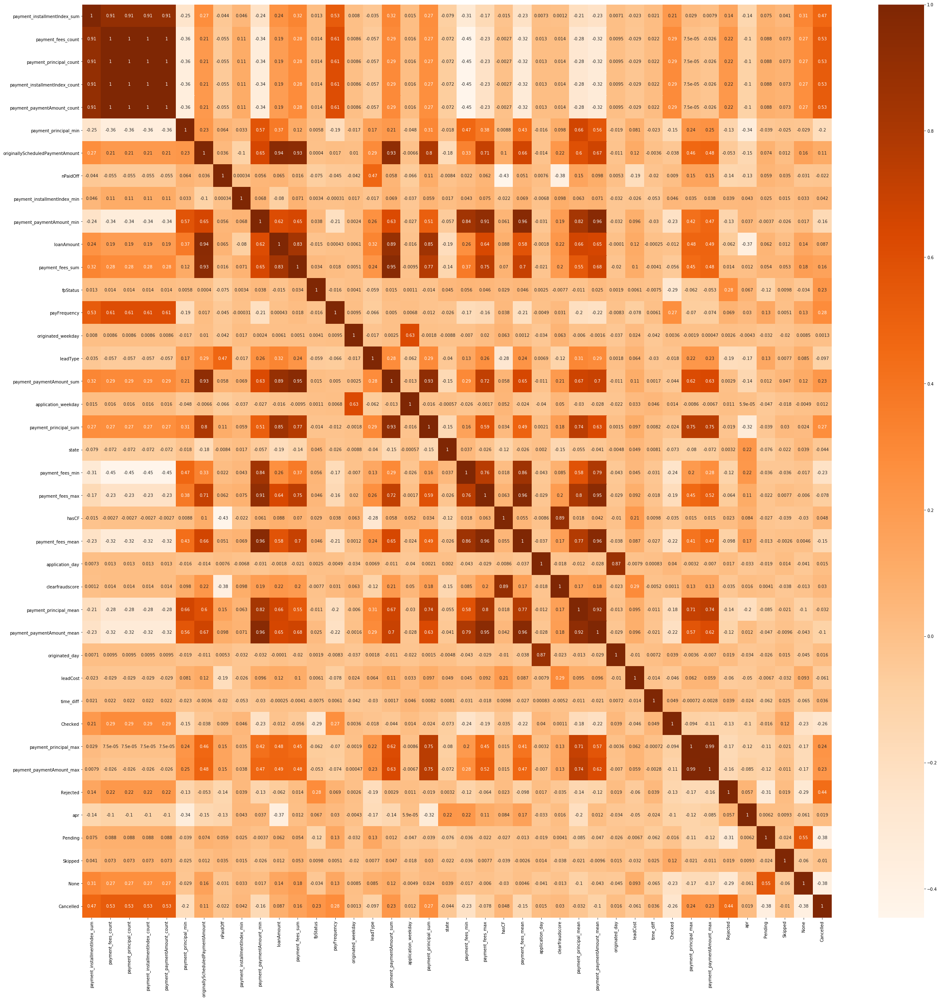

In [69]:
# most correlated features
plt.figure(figsize=(40,40))
g = sns.heatmap(final_data1[cor_feature].corr(),annot=True,cmap="Oranges")

## <a id='6-5'>6.5 Feature Importance using Random forest</a>

The **threshold** value to use for feature selection. Features whose importance is greater or equal are kept while the others are discarded. If “median” (resp. “mean”), then the threshold value is the median (resp. the mean) of the feature importances. A scaling factor (e.g., “0.25*mean”) may also be used.

In [70]:
rf = RandomForestClassifier(n_estimators=100)
rf.fit(final_data1.drop(['Target'],axis=1), final_data1.Target)
features = final_data1.drop(['Target'],axis=1).columns.values
embeded_rf_selector = SelectFromModel(rf, threshold='.25*median')
embeded_rf_selector.fit(final_data1.drop(['Target'],axis=1), final_data1.Target)

SelectFromModel(estimator=RandomForestClassifier(), threshold='.25*median')

In [71]:
embeded_rf_support = embeded_rf_selector.get_support()
embeded_rf_feature = X.loc[:,embeded_rf_support].columns.tolist()
print(str(len(embeded_rf_feature)), 'selected features')

39 selected features


In [72]:
x, y = (list(x) for x in zip(*sorted(zip(rf.feature_importances_, features), 
                                                            reverse = False)))
trace2 = go.Bar(
    x=x ,
    y=y,
    marker=dict(
        color=x,
        colorscale = 'Viridis',
        reversescale = True
    ),
    name='Random Forest Feature importance',
    orientation='h',
)

layout = dict(
    title='Barplot of Feature importances(Random Forest)',
     width = 900, height = 900,
    yaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=True,
#         domain=[0, 0.85],
    ),
    margin=dict(
    l=300,
),
)

fig1 = go.Figure(data=[trace2])
fig1['layout'].update(layout)
py.iplot(fig1, filename='plots')

## <a id='7-6'>7.6 Feature Importance using Lightgbm</a>

In [73]:
lgbc=LGBMClassifier(n_estimators=500)
lgbc.fit(final_data1.drop(['Target'],axis=1), final_data1.Target)
embeded_lgb_selector = SelectFromModel(lgbc, threshold='0.25*median')
embeded_lgb_selector.fit(final_data1.drop(['Target'],axis=1), final_data1.Target)

SelectFromModel(estimator=LGBMClassifier(n_estimators=500),
                threshold='0.25*median')

In [74]:
embeded_lgb_support = embeded_lgb_selector.get_support()
embeded_lgb_feature = X.loc[:,embeded_lgb_support].columns.tolist()
print(str(len(embeded_lgb_feature)), 'selected features')

33 selected features


In [75]:
x, y = (list(x) for x in zip(*sorted(zip(lgbc.booster_.feature_importance(importance_type="gain"), features), 
                                                            reverse = False)))
trace2 = go.Bar(
    x=x ,
    y=y,
    marker=dict(
        color=x,
        colorscale = 'Viridis',
        reversescale = True
    ),
    name='Random Forest Feature importance',
    orientation='h',
)

layout = dict(
    title='Barplot of Feature importances(Lightgbm)',
     width = 900, height = 900,
    yaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=True,
#         domain=[0, 0.85],
    ),
    margin=dict(
    l=300,
),
)

fig1 = go.Figure(data=[trace2])
fig1['layout'].update(layout)
py.iplot(fig1, filename='plots')

## <span style='background :yellow' > intersection of all feature selection technique </span>

In [76]:
pd.set_option('display.max_rows', None)
# put all selection together
feature_selection_df = pd.DataFrame({'Feature':feature_name, 'Pearson':cor_support,
                                    'Random Forest':embeded_rf_support, 'LightGBM':embeded_lgb_support})
# count the selected times for each feature
feature_selection_df['Total'] = np.sum(feature_selection_df, axis=1)
# display the top 20
feature_selection_df = feature_selection_df.sort_values(['Total','Feature'] , ascending=False)
feature_selection_df.index = range(1, len(feature_selection_df)+1)
feature_selection_df.head(40)

,Feature,Pearson,Random Forest,LightGBM,Total
1,time_diff,True,True,True,3
2,state,True,True,True,3
3,payment_principal_sum,True,True,True,3
4,payment_principal_min,True,True,True,3
5,payment_principal_mean,True,True,True,3
6,payment_principal_max,True,True,True,3
7,payment_paymentAmount_sum,True,True,True,3
8,payment_paymentAmount_min,True,True,True,3
9,payment_paymentAmount_mean,True,True,True,3
10,payment_paymentAmount_max,True,True,True,3


In [77]:
# final_data1.to_csv('final_data1.csv')

In [78]:
# pip install -U imbalanced-learn

# <a id='8'>8. Modeling </a>

# lightgbm Model

In [79]:
# ====================================================
# Library
# ====================================================
import os
import gc
import warnings
warnings.filterwarnings('ignore')
import random
import scipy as sp
import joblib
import itertools
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
from tqdm.auto import tqdm
from sklearn.model_selection import StratifiedKFold, train_test_split
import lightgbm as lgb
from itertools import combinations
#Import the SMOTE
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

After grid_search Implementation the best Hyperparameter is :

In [80]:
params = {
'boosting_type': 'gbdt',
 'colsample_bytree': 0.6,
 'learning_rate': 0.004999999999999999,
 'min_child_samples': 20,
 'n_estimators': 94,
 'num_leaves': 20,
 'objective': 'binary',
 'save_binary': True,
 'verbose': 1,
 'n_estimators': 1000,
 'metric': 'auc',
 'is_unbalance': True,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 0.5}

In [81]:
# ====================================================
# Configurations
# ====================================================
class CFG:

    seed = 42
    n_folds = 5
    target = 'Target'

# ====================================================
# Seed everything
# ====================================================
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

In [82]:
data = final_data1.copy()
features = [col for col in data.columns if col not in [ CFG.target]]

**SMOTE** or Synthetic Minority Oversampling Technique is an oversampling technique:

In [83]:

smote = SMOTE(random_state = 101)
X_oversample, y_oversample = smote.fit_resample(data[features],data[CFG.target])
data = pd.merge(X_oversample, y_oversample, left_index=True, right_index=True)

In [84]:
data.shape

(77312, 46)

In [85]:
# Create a numpy array to store out of folds predictions
# oof_predictions = np.zeros(len(data))
kfold = StratifiedKFold(n_splits = CFG.n_folds, shuffle = True, random_state = CFG.seed)
for fold, (trn_ind, val_ind) in enumerate(kfold.split(data, data[CFG.target])):
    print(' ')
    print('-'*50)
    print(f'Training fold {fold} with {len(features)} features...')
    x_train, x_val = data[features].iloc[trn_ind], data[features].iloc[val_ind]
    y_train, y_val = data[CFG.target].iloc[trn_ind], data[CFG.target].iloc[val_ind]
    lgb_train = lgb.Dataset(x_train, y_train)
    lgb_valid = lgb.Dataset(x_val, y_val)
    model = lgb.train(
        params = params,
        train_set = lgb_train,
        num_boost_round = 10500,
        valid_sets = [lgb_train, lgb_valid],
        early_stopping_rounds = 100,
        verbose_eval = 500,
        
        )

 
--------------------------------------------------
Training fold 0 with 45 features...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 30925, number of negative: 30924
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8189
[LightGBM] [Info] Number of data points in the train set: 61849, number of used features: 42
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500008 -> initscore=0.000032
[LightGBM] [Info] Start training from score 0.000032
Training until validation scores don't improve for 100 rounds
[500]	training's auc: 0.995927	valid_1's auc: 0.995604
[1000]	training's auc: 0.998837	valid_1's auc: 0.998683
Did not meet early stopping. Best iteration is:
[1000]	training's auc: 0.998837	val

In [86]:
# Save best model
joblib.dump(model, 'DS Assessment model.pkl')
# Predict validation
val_pred = model.predict(x_val)

### Evaluation of trained model on different classification metrics

In [87]:
from sklearn.metrics import roc_curve, roc_auc_score 

auc = roc_auc_score(y_val, val_pred)

print(' {:.5f} ROC AUC on the valid set.'.format(auc))

 0.99875 ROC AUC on the valid set.


In [88]:
# True positive rate and false positive rate.
fpr, tpr, _ = roc_curve(y_val, val_pred)
def plot_roc_curve(fpr, tpr, clf_name, figsize_w, figsize_h, filename):
    """
    Plot the ROC curve of a classifier.
    """
    plt.figure(figsize=(figsize_w,figsize_h))
    sns.set(style="whitegrid")
    plt.plot([0, 1], [0, 1], 'k--', label='random')
    plt.plot(fpr, tpr, label=clf_name)
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.savefig(filename)
    plt.show()
    return



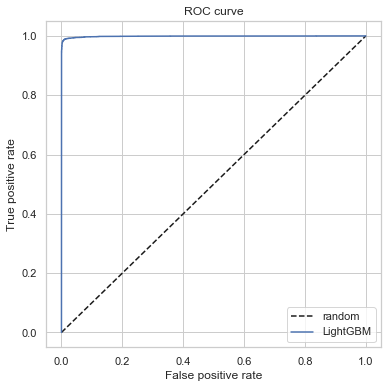

In [89]:
plot_roc_curve(fpr=fpr, tpr=tpr, clf_name='LightGBM', figsize_w=6, figsize_h=6, filename='./ROCCurve.png')

LightGBM Model accuracy score: 0.9893
Confusion matrix

 [[7692   39]
 [ 126 7605]]

True Positives(TP) =  7692

True Negatives(TN) =  7605

False Positives(FP) =  39

False Negatives(FN) =  126
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      7731
           1       0.99      0.98      0.99      7731

    accuracy                           0.99     15462
   macro avg       0.99      0.99      0.99     15462
weighted avg       0.99      0.99      0.99     15462



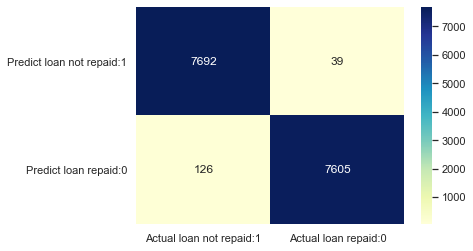

In [94]:
y_pred = val_pred.round(0)
# view accuracy
accuracy=accuracy_score(y_pred, y_val)
print('LightGBM Model accuracy score: {0:0.4f}'.format(accuracy_score(y_val, y_pred)))

# view confusion-matrix
# Print the Confusion Matrix and slice it into four pieces


cm = confusion_matrix(y_val, y_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

# visualize confusion matrix with seaborn heatmap

cm_matrix = pd.DataFrame(data=cm, columns=['Actual loan not repaid:1', 'Actual loan repaid:0'], 
                                 index=['Predict loan not repaid:1', 'Predict loan repaid:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

#classification_report
print(classification_report(y_val, y_pred))